<centre><h1> Twitter Sentiment Analysis </h1></centre>

![Elon Mask Twitter](https://st.adda247.com/https://adda247-wp-multisite-assets.s3.ap-south-1.amazonaws.com/wp-content/uploads/multisite/sites/5/2022/07/12091330/twitter.jpg "Twitter Sentiment Analysis")

In [2]:
import pandas as pd
import numpy as np
import os

In [3]:
os.chdir(r"D:\Ritwik's Download\ML projects")

In [4]:
df = pd.read_json("data_503986.json")
df

,id,text
0,1596647314030231552,@DonutOperator @elonmusk @stillgray It's fiery...
1,1596647313887346689,@SenMarkey @elonmusk Anti-freedom is anti-Amer...
2,1596647313719853056,@FoxNews Elon Musk voices support for Trump ri...
3,1596647313346215941,@elonmusk @CollinRugg Having meetings about me...
4,1596647312746754048,@GregA06555436 @elonmusk @TimRunsHisMouth Yes!...
...,...,...
503981,1615836342079954960,@DylanLeClair_ @elonmusk @joshhzimmer @stats_f...
503982,1615836341660524564,"#pollen, #flu, #COVID19 They all look simila..."
503983,1615836340758904832,You people need to calm the fck down with the ...
503984,1615836340490313759,@elonmusk I would love to know who voted yes o...


In [5]:
df.text[650]

"@elonmusk Worse case, they've no logical argument so they start with the childish name-calling and I have to block them."

## Text Preprocessing

### Removing the unnecessary words

> - **It's mean we will remove all links, html references, new line characters, hashtags and all unnecessary words**
> - **Only will take the alphabets and numbers**

In [6]:
import regex as re

In [7]:
def preprocessing(raw):
    # Removing special characters and digits
    sentence = re.sub("[^a-zA-Z0-9%\s]", " ", raw)
    
    # removing the word of https/http if left out
    sentence = re.sub(r'\bhttps?\b', '', sentence)
    
    # Remove instances where "https" or "http" is concatenated with other words
    sentence = re.sub(r'https?\S+', '', sentence)
    # change sentence to lower case
    sentence = sentence.lower()

    return sentence

In [8]:
df["preprocessed_text"] = df["text"].apply(preprocessing)

In [9]:
df.sample(10)

,id,text,preprocessed_text
182272,1601206263840272385,@Henry__Windsor @Scampi13 @elonmusk @catturd2 ...,henry windsor scampi13 elonmusk catturd2 ...
274619,1602400280074915840,@signaturedoc @elonmusk In my opinion people t...,signaturedoc elonmusk in my opinion people t...
109271,1600088657926520833,"Hey, @elonmusk why aren't my Likes or RTs not ...",hey elonmusk why aren t my likes or rts not ...
31950,1598788997761077248,@AmieWohrer @elonmusk But we've never met 😳👀,amiewohrer elonmusk but we ve never met
400652,1604550703477043200,@bettkink @BrandonLive @ronnypasadena @being__...,bettkink brandonlive ronnypasadena being ...
201300,1601435146267525122,"@ThisIsKyleR @elonmusk Because, just because y...",thisiskyler elonmusk because just because y...
181352,1601191096117493760,@POTUS @elonmusk Where is the Fact check on th...,potus elonmusk where is the fact check on th...
226986,1601617590945984512,@KeithOlbermann @elonmusk @KeithOlbermann is y...,keitholbermann elonmusk keitholbermann is y...
82747,1599655952466456576,@JavierS19541304 @BillyM2k @elonmusk thank me ...,javiers19541304 billym2k elonmusk thank me ...
438394,1605049324227936256,@BaileyYankee1 @SixtySecDragon @marc_tesla @pr...,baileyyankee1 sixtysecdragon marc tesla pr...


In [10]:
df.shape

(503986, 3)

## N-Grams

> - **Bi-gram:
A bigram refers to a sequence of two consecutive words in a given text. It captures the relationship between adjacent words and provides context to understand how words are connected. Bigrams are commonly used in various NLP tasks, such as language modeling, text generation, and information retrieval.**
> - **For example, consider the sentence: "I love ice cream." The bigrams in this sentence would be:
"I love"
"love ice"
"ice cream"
By analyzing these bigrams, we can observe which words frequently appear together and derive insights from the patterns. In this case, the bigram "ice cream" suggests a relationship between the words, indicating a common phrase.**

> - **Tri-gram:
A trigram refers to a sequence of three consecutive words in a given text. It extends the concept of bigrams by capturing more context and allowing for a deeper understanding of word relationships. Trigrams are particularly useful in tasks like language modeling, machine translation, and text summarization.
Expanding on the previous example, let's consider the sentence: "I love eating ice cream." The trigrams in this sentence would be:**
> - **"I love eating"
"love eating ice"
"eating ice cream"
By examining trigrams, we gain a more comprehensive view of how words interact with each other. It helps in identifying phrases, collocations, and patterns that occur frequently in the text.**

**We can see or observe that there must be some spam email or there would be some spammer on twitter who @tag Elon Mask for ganning the popularity or anything else but without any right purpose.**

**We will Visualize some most commonly used words(in the form of bi-grams and tri-grams)**

> at first removing the empty cells or words then analyze the word first

### Get Top n Bi-grams

In [11]:
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from nltk.stem import WordNetLemmatizer

In [12]:
import chart_studio
from textblob import TextBlob
from sklearn.feature_extraction.text import CountVectorizer
from nltk.tokenize import RegexpTokenizer
from nltk.probability import FreqDist
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from PIL import Image  

In [14]:
# the most common used stopwords
victim = set([
    'i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd",
    'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers',
    'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which',
    'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been',
    'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if',
    'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between',
    'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out',
    'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why',
    'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not',
    'only', 'own', 'same', 'so', 'than', 'too', 'very', 's', 't', 'can', 'will', 'just', 'don', "don't",
    'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', 've', 'y', 'ain', 'aren', "aren't", 'couldn',
    "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn', "hadn't", 'hasn', "hasn't", 'haven', "haven't",
    'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn', "mustn't", 'needn', "needn't", 'shan', "shan't",
    'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", 'won', "won't", 'wouldn', "wouldn't", "ff", "suffering",
    "I", "and"
])

In [15]:
# top n bi-grams
def get_top_n_bigram(corpus, n=None):
    vec = CountVectorizer(ngram_range=(2, 2), stop_words=victim).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]


In [16]:
# check for most frequent 20 words at 'preproccesed_text' at df
common_words = get_top_n_bigram(df["preprocessed_text"], 21)
common_words = common_words[1:]

In [17]:
common_words

[('elonmusk co', 13522),
 ('free speech', 10250),
 ('elonmusk twitter', 10221),
 ('tomfitton elonmusk', 5871),
 ('lp locked', 4920),
 ('trump elonmusk', 4842),
 ('experienced team', 4812),
 ('busd rewards', 4798),
 ('presale private', 4795),
 ('team tokens', 4794),
 ('low starting', 4784),
 ('team low', 4783),
 ('starting lp', 4783),
 ('lp presale', 4783),
 ('private team', 4783),
 ('bsc lp', 4779),
 ('rewards experienced', 4779),
 ('locked busd', 4778),
 ('trumplon trumplon', 4778),
 ('trumplon trump', 4778)]

### Visualize the data for more clarity

In [18]:
import plotly_express as px

In [19]:
df1 = pd.DataFrame(common_words, columns = ['TweetText' , 'count'])
df1

,TweetText,count
0,elonmusk co,13522
1,free speech,10250
2,elonmusk twitter,10221
3,tomfitton elonmusk,5871
4,lp locked,4920
5,trump elonmusk,4842
6,experienced team,4812
7,busd rewards,4798
8,presale private,4795
9,team tokens,4794


In [22]:
fig = px.bar(df1, x = "TweetText", y = "count", color = "count")
fig.update_layout(title = "Top 20 bigrams in Tweet before removing spams")
fig.show()

## Spam Detection and removal

As we can see from the above barplot, in the **Elon Mask** tweet there are many othere focused word and this are all spam that they are focussing on othere filed but attract audiance by the @tag or Elon Mask name.
We have to remove those words contained lines and use the rest of the dataset.

In [23]:
#sample found list of words
to_drop = ["LP LOCKED", "accumulated 1 ETH","This guy accumulated over $100K", "help me sell a nickname", "As A Big Fuck You To The SEC", "Wanna be TOP G", "#walv", "#NFTProject", "#1000xgem", "$GALI", "NFT", "What the Soul of USA is", "#BUSD", "$FXMS", "#fxms", "#Floki", "#FLOKIXMAS", "#memecoin", "#lowcapgem", "#frogxmas", "Xmas token", "crypto space", "Busd Rewards", "TRUMPLON", "NO PRESALE", "#MIKOTO", "$HATI", "$SKOLL", "#ebaydeals", "CHRISTMAS RABBIT", "@cz_binance", "NFT Airdrop", "#NFT"]


In [24]:
x = "|".join(to_drop)
x

'LP LOCKED|accumulated 1 ETH|This guy accumulated over $100K|help me sell a nickname|As A Big Fuck You To The SEC|Wanna be TOP G|#walv|#NFTProject|#1000xgem|$GALI|NFT|What the Soul of USA is|#BUSD|$FXMS|#fxms|#Floki|#FLOKIXMAS|#memecoin|#lowcapgem|#frogxmas|Xmas token|crypto space|Busd Rewards|TRUMPLON|NO PRESALE|#MIKOTO|$HATI|$SKOLL|#ebaydeals|CHRISTMAS RABBIT|@cz_binance|NFT Airdrop|#NFT'

In [25]:
df = df[~df['text'].str.contains('|'.join(to_drop))]
df

,id,text,preprocessed_text
0,1596647314030231552,@DonutOperator @elonmusk @stillgray It's fiery...,donutoperator elonmusk stillgray it s fiery...
1,1596647313887346689,@SenMarkey @elonmusk Anti-freedom is anti-Amer...,senmarkey elonmusk anti freedom is anti amer...
2,1596647313719853056,@FoxNews Elon Musk voices support for Trump ri...,foxnews elon musk voices support for trump ri...
3,1596647313346215941,@elonmusk @CollinRugg Having meetings about me...,elonmusk collinrugg having meetings about me...
4,1596647312746754048,@GregA06555436 @elonmusk @TimRunsHisMouth Yes!...,grega06555436 elonmusk timrunshismouth yes ...
...,...,...,...
503981,1615836342079954960,@DylanLeClair_ @elonmusk @joshhzimmer @stats_f...,dylanleclair elonmusk joshhzimmer stats f...
503982,1615836341660524564,"#pollen, #flu, #COVID19 They all look simila...",pollen flu covid19 they all look simila...
503983,1615836340758904832,You people need to calm the fck down with the ...,you people need to calm the fck down with the ...
503984,1615836340490313759,@elonmusk I would love to know who voted yes o...,elonmusk i would love to know who voted yes o...


- **The size of the dataset is reduced to $503986$ to $487047$ data**

In [26]:
# drop the id column
df.drop(["id"], axis=1, inplace=True)

C:\Users\RITWIK~1\AppData\Local\Temp/ipykernel_10420/3741461445.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [27]:
df

,text,preprocessed_text
0,@DonutOperator @elonmusk @stillgray It's fiery...,donutoperator elonmusk stillgray it s fiery...
1,@SenMarkey @elonmusk Anti-freedom is anti-Amer...,senmarkey elonmusk anti freedom is anti amer...
2,@FoxNews Elon Musk voices support for Trump ri...,foxnews elon musk voices support for trump ri...
3,@elonmusk @CollinRugg Having meetings about me...,elonmusk collinrugg having meetings about me...
4,@GregA06555436 @elonmusk @TimRunsHisMouth Yes!...,grega06555436 elonmusk timrunshismouth yes ...
...,...,...
503981,@DylanLeClair_ @elonmusk @joshhzimmer @stats_f...,dylanleclair elonmusk joshhzimmer stats f...
503982,"#pollen, #flu, #COVID19 They all look simila...",pollen flu covid19 they all look simila...
503983,You people need to calm the fck down with the ...,you people need to calm the fck down with the ...
503984,@elonmusk I would love to know who voted yes o...,elonmusk i would love to know who voted yes o...


### Expanding the contractions

> **Also noticed that there were problems with the contractions of some words. $"Don’t know"$ became $"don know"$ instead of $"do not know"$. To overcome this problem I will use the contraction library of python**

In [28]:
def expand_contractions(text):
    
      try:
        return contractions.fix(text)
      except:
        return text

In [29]:
df['expanded_text'] = df['text'].apply(expand_contractions)
df['processed_text'] = df['expanded_text'].apply(preprocessing)

C:\Users\RITWIK~1\AppData\Local\Temp/ipykernel_10420/1389986589.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\RITWIK~1\AppData\Local\Temp/ipykernel_10420/1389986589.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [30]:
df.drop(["preprocessed_text"], axis=1, inplace=True)

C:\Users\RITWIK~1\AppData\Local\Temp/ipykernel_10420/1933573410.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [31]:
df

,text,expanded_text,processed_text
0,@DonutOperator @elonmusk @stillgray It's fiery...,@DonutOperator @elonmusk @stillgray It's fiery...,donutoperator elonmusk stillgray it s fiery...
1,@SenMarkey @elonmusk Anti-freedom is anti-Amer...,@SenMarkey @elonmusk Anti-freedom is anti-Amer...,senmarkey elonmusk anti freedom is anti amer...
2,@FoxNews Elon Musk voices support for Trump ri...,@FoxNews Elon Musk voices support for Trump ri...,foxnews elon musk voices support for trump ri...
3,@elonmusk @CollinRugg Having meetings about me...,@elonmusk @CollinRugg Having meetings about me...,elonmusk collinrugg having meetings about me...
4,@GregA06555436 @elonmusk @TimRunsHisMouth Yes!...,@GregA06555436 @elonmusk @TimRunsHisMouth Yes!...,grega06555436 elonmusk timrunshismouth yes ...
...,...,...,...
503981,@DylanLeClair_ @elonmusk @joshhzimmer @stats_f...,@DylanLeClair_ @elonmusk @joshhzimmer @stats_f...,dylanleclair elonmusk joshhzimmer stats f...
503982,"#pollen, #flu, #COVID19 They all look simila...","#pollen, #flu, #COVID19 They all look simila...",pollen flu covid19 they all look simila...
503983,You people need to calm the fck down with the ...,You people need to calm the fck down with the ...,you people need to calm the fck down with the ...
503984,@elonmusk I would love to know who voted yes o...,@elonmusk I would love to know who voted yes o...,elonmusk i would love to know who voted yes o...


### Bi-gram without spam

In [32]:
not_spam_words = get_top_n_bigram(df["processed_text"], 21)
not_spam_words = common_words[1:]

In [33]:
not_spam_words

[('free speech', 10250),
 ('elonmusk twitter', 10221),
 ('tomfitton elonmusk', 5871),
 ('lp locked', 4920),
 ('trump elonmusk', 4842),
 ('experienced team', 4812),
 ('busd rewards', 4798),
 ('presale private', 4795),
 ('team tokens', 4794),
 ('low starting', 4784),
 ('team low', 4783),
 ('starting lp', 4783),
 ('lp presale', 4783),
 ('private team', 4783),
 ('bsc lp', 4779),
 ('rewards experienced', 4779),
 ('locked busd', 4778),
 ('trumplon trumplon', 4778),
 ('trumplon trump', 4778)]

In [34]:
df2 = pd.DataFrame(not_spam_words, columns=["words", "count"])
df2

,words,count
0,free speech,10250
1,elonmusk twitter,10221
2,tomfitton elonmusk,5871
3,lp locked,4920
4,trump elonmusk,4842
5,experienced team,4812
6,busd rewards,4798
7,presale private,4795
8,team tokens,4794
9,low starting,4784


In [35]:
fig = px.bar(df2, x = "words", y = "count", color = "count")
fig.update_layout(title = "Top 20 bigrams in Tweet after removing spams")


## WordCloud

> With the word clouds, we can visualize two things. The so-called uni-grams i.e. the single words but also the mentions. It can be interesting to see which personalities are mentioned the most in the tweets about Elon Musk. Let’s have a look at it together!
Also we can visualize the bi-grams as well, the most frequent words used with the tweets of Elon Mask.

##### 🚀 The data is already cleaned and probable spam free now we have to lemmitize or stemming the data i.e. convert the data to it's root form for more clarity and accuracy 🚀

### Uni-Gram

In [36]:
from nltk.stem import PorterStemmer

ps = PorterStemmer()

In [37]:
def stem_word(word):
    return ps.stem(word)

In [38]:
# stemming processed text
df["stem_text"] = df.processed_text.apply(stem_word)

C:\Users\RITWIK~1\AppData\Local\Temp/ipykernel_10420/2859923708.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [39]:
# join everything in a list
cleaned_words = " ".join([word for word in df.stem_text])

In [40]:
import random
import matplotlib.pyplot as plt

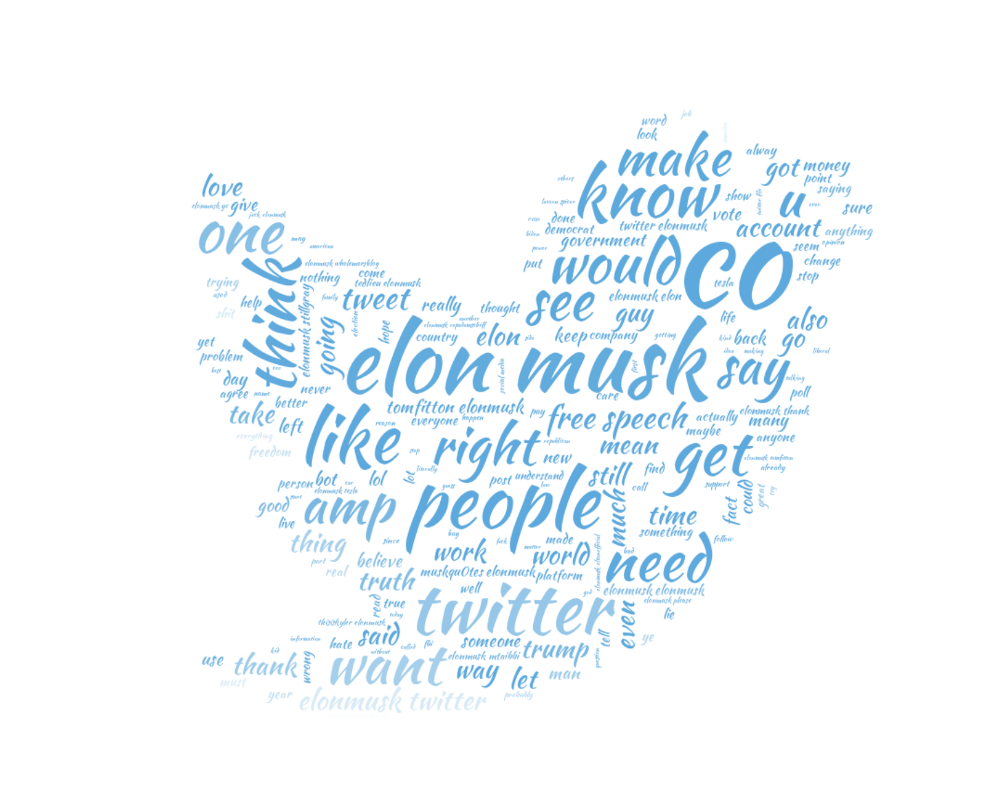

In [42]:
image_mask = np.array(Image.open('rick.jpg'))

# will take the image color as it has
colors = ImageColorGenerator(image_mask)

wordcloud = WordCloud(
    stopwords=victim,
    width=2000,
    height=2000,
    background_color='white',
    mode="RGBA",
    font_path="D:\Ritwik's Download\Data Analysis\KaushanScript-Regular.otf",
    mask = image_mask
).generate(cleaned_words)

plt.figure(figsize=[20, 20])
plt.axis('off')
plt.tight_layout(pad=0)
plt.imshow(wordcloud.recolor(color_func = colors), interpolation="bilinear")

# Store visualization to file
# plt.savefig("twitter_logo_unigram.png", format="png")

plt.show()
     

### Same wordcloud with differerent format

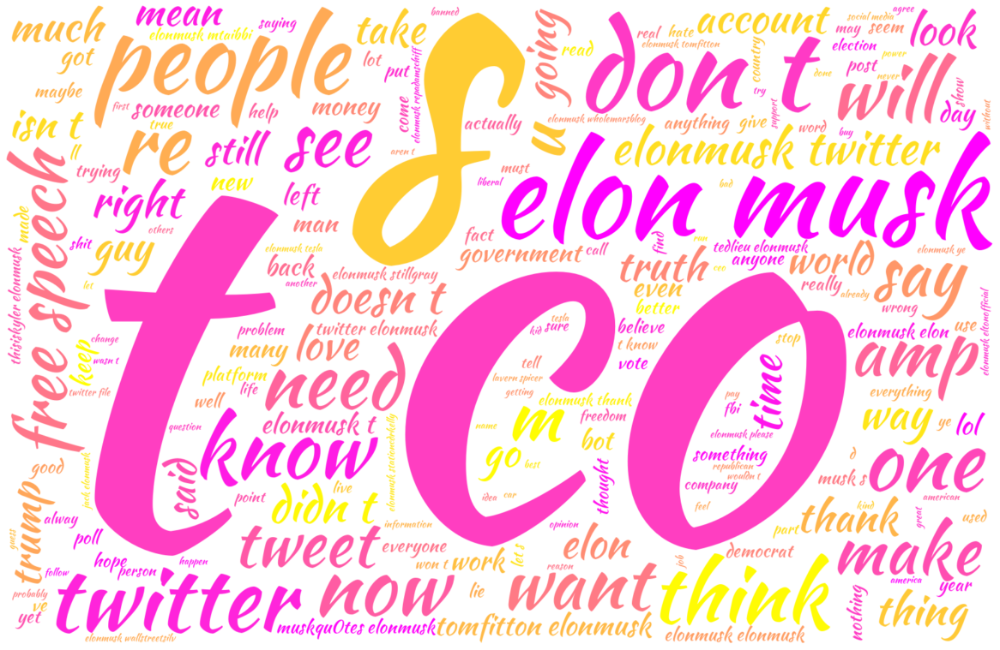

In [44]:
# mask = np.array(Image.open("twitter2.png"))
stopwords = set(STOPWORDS)

wordcloud_twitter = WordCloud(height=1100,
                              width=1700,
                              background_color="white",
                              mode="RGBA",
                              colormap=random.choice(plt.colormaps()),
                              stopwords=stopwords,
                              font_path="D:\Ritwik's Download\Data Analysis\KaushanScript-Regular.otf",
                                 ).generate(cleaned_words)

# Create coloring from the image
# image_colors = ImageColorGenerator(mask)
plt.figure(figsize=[16, 14])
plt.axis('off')
plt.tight_layout(pad=0)
plt.imshow(wordcloud_twitter, interpolation="bilinear")

# Store visualization to file
# plt.savefig("twitter_logo_unigram.png", format="png")

plt.show()

### WordCloud of mentions

> - **After the most frequent words, it's the  time for the most mentioned/tagged names in tweeter**
> - **In this section we will focus the most frequent tagged persons in tweeter.**

In [45]:
# fetch all occurance of @tagged name
df["mentions"] = df["text"].str.findall(r"@\w+")

# remove all '@' tag from the beggining of accounts
df['mentions'] = [list(map(lambda x: x[1:], i)) for i in df['mentions']]

# convert list of words in each row to string
df["mentions"] = df["mentions"].apply(lambda x: " ".join(x))

# concatenate all string into one string
mention_word = " ".join([i for i in df.mentions])

C:\Users\RITWIK~1\AppData\Local\Temp/ipykernel_10420/4119855544.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\RITWIK~1\AppData\Local\Temp/ipykernel_10420/4119855544.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\RITWIK~1\AppData\Local\Temp/ipykernel_10420/4119855544.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.

In [46]:
df

,text,expanded_text,processed_text,stem_text,mentions
0,@DonutOperator @elonmusk @stillgray It's fiery...,@DonutOperator @elonmusk @stillgray It's fiery...,donutoperator elonmusk stillgray it s fiery...,donutoperator elonmusk stillgray it s fiery...,DonutOperator elonmusk stillgray
1,@SenMarkey @elonmusk Anti-freedom is anti-Amer...,@SenMarkey @elonmusk Anti-freedom is anti-Amer...,senmarkey elonmusk anti freedom is anti amer...,senmarkey elonmusk anti freedom is anti amer...,SenMarkey elonmusk
2,@FoxNews Elon Musk voices support for Trump ri...,@FoxNews Elon Musk voices support for Trump ri...,foxnews elon musk voices support for trump ri...,foxnews elon musk voices support for trump ri...,FoxNews
3,@elonmusk @CollinRugg Having meetings about me...,@elonmusk @CollinRugg Having meetings about me...,elonmusk collinrugg having meetings about me...,elonmusk collinrugg having meetings about me...,elonmusk CollinRugg
4,@GregA06555436 @elonmusk @TimRunsHisMouth Yes!...,@GregA06555436 @elonmusk @TimRunsHisMouth Yes!...,grega06555436 elonmusk timrunshismouth yes ...,grega06555436 elonmusk timrunshismouth yes ...,GregA06555436 elonmusk TimRunsHisMouth
...,...,...,...,...,...
503981,@DylanLeClair_ @elonmusk @joshhzimmer @stats_f...,@DylanLeClair_ @elonmusk @joshhzimmer @stats_f...,dylanleclair elonmusk joshhzimmer stats f...,dylanleclair elonmusk joshhzimmer stats f...,DylanLeClair_ elonmusk joshhzimmer stats_feed
503982,"#pollen, #flu, #COVID19 They all look simila...","#pollen, #flu, #COVID19 They all look simila...",pollen flu covid19 they all look simila...,pollen flu covid19 they all look simila...,elonmusk benshapiro drsanjaygupta
503983,You people need to calm the fck down with the ...,You people need to calm the fck down with the ...,you people need to calm the fck down with the ...,you people need to calm the fck down with the ...,
503984,@elonmusk I would love to know who voted yes o...,@elonmusk I would love to know who voted yes o...,elonmusk i would love to know who voted yes o...,elonmusk i would love to know who voted yes o...,elonmusk


#### With ELON MUSK

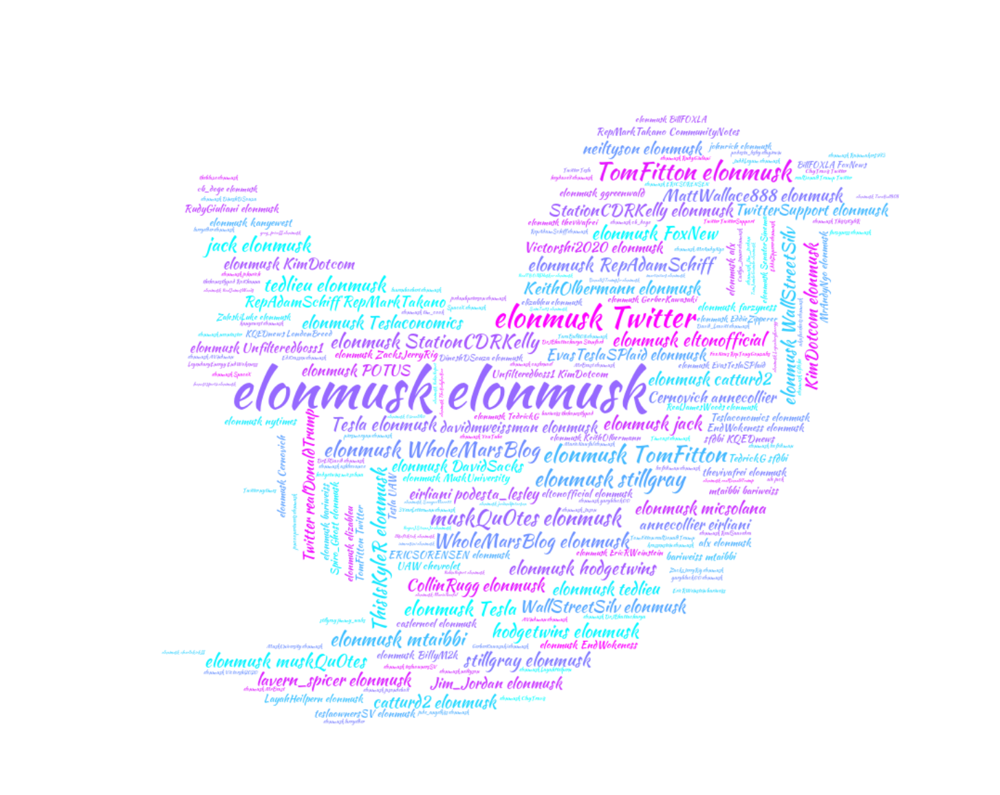

In [52]:
image_mask = np.array(Image.open('rick.jpg'))

# will take the image color as it has
colors = ImageColorGenerator(image_mask)

wordcloud = WordCloud(
    stopwords=victim,
    width=2000,
    height=2000,
    background_color='white',
    mode="RGBA",
    colormap=random.choice(plt.colormaps()),
    font_path="D:\Ritwik's Download\Data Analysis\KaushanScript-Regular.otf",
    mask = image_mask
).generate(mention_word)

plt.figure(figsize=[20, 20])
plt.axis('off')
plt.tight_layout(pad=0)
plt.imshow(wordcloud, interpolation="bilinear")

# Store visualization to file
# plt.savefig("twitter_logo_unigram.png", format="png")

plt.show()
     

### Without ELON MASK

In [53]:
rem = "elonmusk"
new_str = ""

for i in mention_word.split():
    if i != rem:
        new_str += i + " "
        
new_str = new_str.strip()

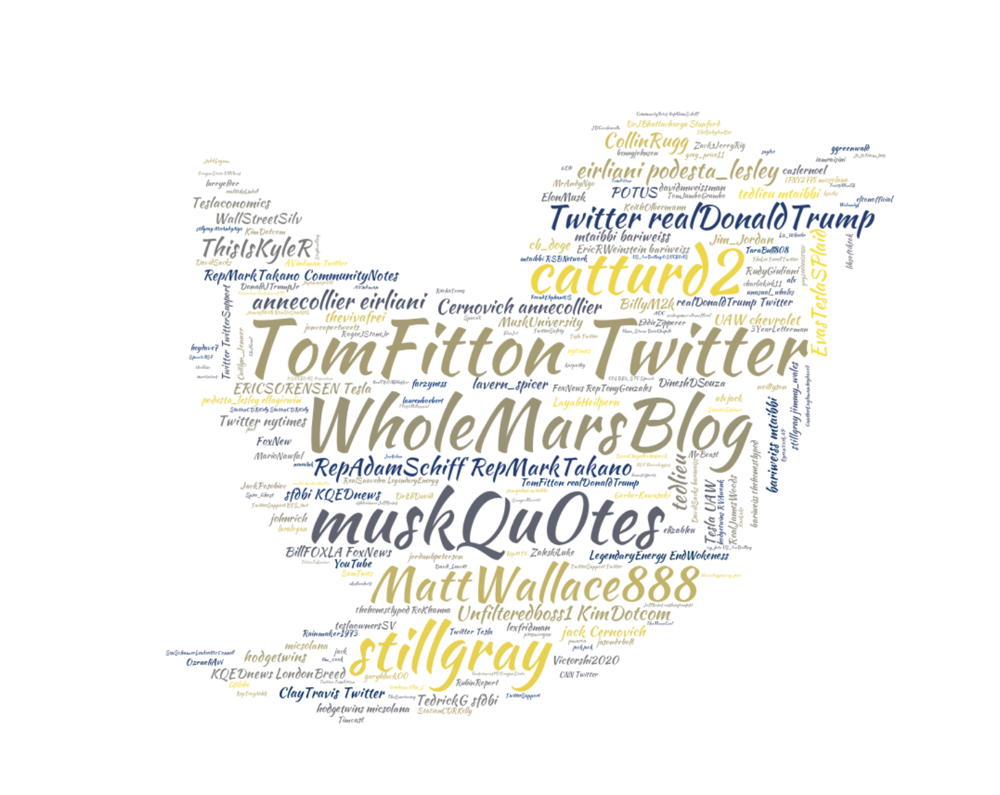

In [55]:
image_mask = np.array(Image.open('rick.jpg'))

# will take the image color as it has
colors = ImageColorGenerator(image_mask)

wordcloud = WordCloud(
    stopwords=victim,
    width=2000,
    height=2000,
    background_color='white',
    mode="RGBA",
    colormap=random.choice(plt.colormaps()),
    font_path="D:\Ritwik's Download\Data Analysis\KaushanScript-Regular.otf",
    mask = image_mask
).generate(new_str)

plt.figure(figsize=[20, 20])
plt.axis('off')
plt.tight_layout(pad=0)
plt.imshow(wordcloud, interpolation="bilinear")

# Store visualization to file
# plt.savefig("twitter_logo_unigram.png", format="png")

plt.show()

## Emoji Analysis Twitter


> **In twitter also it is seen there are many emojies used for the perfection of the tweeter. Now we will be seeing the most emojies used in the twitter.**
> **Emojis are special characters, and not all of them can be detected natively. So, to detect them correctly, I used the emot library.**

In [56]:
import emot

In [57]:
emot_obj = emot.core.emot()

In [58]:
def extract_emojies(text):
    
    res = emot_obj.emoji(text)
    return res['value']

In [59]:
df["emojies"] = df.text.apply(extract_emojies)

Issue with internal pattern finding emoji: '🇬'


C:\Users\RITWIK~1\AppData\Local\Temp/ipykernel_10420/2363114697.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [60]:
df

,text,expanded_text,processed_text,stem_text,mentions,emojies
0,@DonutOperator @elonmusk @stillgray It's fiery...,@DonutOperator @elonmusk @stillgray It's fiery...,donutoperator elonmusk stillgray it s fiery...,donutoperator elonmusk stillgray it s fiery...,DonutOperator elonmusk stillgray,[🤷‍♂️]
1,@SenMarkey @elonmusk Anti-freedom is anti-Amer...,@SenMarkey @elonmusk Anti-freedom is anti-Amer...,senmarkey elonmusk anti freedom is anti amer...,senmarkey elonmusk anti freedom is anti amer...,SenMarkey elonmusk,[]
2,@FoxNews Elon Musk voices support for Trump ri...,@FoxNews Elon Musk voices support for Trump ri...,foxnews elon musk voices support for trump ri...,foxnews elon musk voices support for trump ri...,FoxNews,[]
3,@elonmusk @CollinRugg Having meetings about me...,@elonmusk @CollinRugg Having meetings about me...,elonmusk collinrugg having meetings about me...,elonmusk collinrugg having meetings about me...,elonmusk CollinRugg,[]
4,@GregA06555436 @elonmusk @TimRunsHisMouth Yes!...,@GregA06555436 @elonmusk @TimRunsHisMouth Yes!...,grega06555436 elonmusk timrunshismouth yes ...,grega06555436 elonmusk timrunshismouth yes ...,GregA06555436 elonmusk TimRunsHisMouth,[]
...,...,...,...,...,...,...
503981,@DylanLeClair_ @elonmusk @joshhzimmer @stats_f...,@DylanLeClair_ @elonmusk @joshhzimmer @stats_f...,dylanleclair elonmusk joshhzimmer stats f...,dylanleclair elonmusk joshhzimmer stats f...,DylanLeClair_ elonmusk joshhzimmer stats_feed,[🤔]
503982,"#pollen, #flu, #COVID19 They all look simila...","#pollen, #flu, #COVID19 They all look simila...",pollen flu covid19 they all look simila...,pollen flu covid19 they all look simila...,elonmusk benshapiro drsanjaygupta,[]
503983,You people need to calm the fck down with the ...,You people need to calm the fck down with the ...,you people need to calm the fck down with the ...,you people need to calm the fck down with the ...,,[]
503984,@elonmusk I would love to know who voted yes o...,@elonmusk I would love to know who voted yes o...,elonmusk i would love to know who voted yes o...,elonmusk i would love to know who voted yes o...,elonmusk,[]


In [61]:
import collections

In [62]:
# count the emojies in each column
df['emojies'].apply(lambda x: collections.Counter(x))

0         {'🤷‍♂️': 1}
1                  {}
2                  {}
3                  {}
4                  {}
             ...     
503981       {'🤔': 1}
503982             {}
503983             {}
503984             {}
503985             {}
Name: emojies, Length: 487047, dtype: object

In [63]:
# combine the count
combined_counts = sum(df['emojies'].apply(lambda x: collections.Counter(x)), collections.Counter())

# tranform into a dictionary
emoji_dict = dict(combined_counts)

# sort the dictionary
sorted_emoji_dict = dict(sorted(emoji_dict.items(), key=lambda x: x[1], reverse=True))

In [64]:
sorted_emoji_dict

{'😂': 14602,
 '🤣': 13330,
 '🔥': 3402,
 '👇': 3372,
 '🙏': 3191,
 '❤': 3189,
 '🤡': 2952,
 '🤔': 2901,
 '👍': 2385,
 '🇺🇸': 2212,
 '✅': 2134,
 '🚀': 2085,
 '🙄': 1932,
 '😭': 1857,
 '💯': 1655,
 '👏': 1648,
 '😉': 1164,
 '😆': 1155,
 '😁': 1001,
 '😅': 987,
 '😎': 945,
 '👀': 932,
 '😍': 864,
 '😊': 862,
 '💩': 790,
 '😘': 703,
 '💀': 662,
 '💥': 652,
 '🤷\u200d♂️': 627,
 '🥰': 618,
 '👌': 598,
 '🐰': 552,
 '💪': 513,
 '‼': 492,
 '😳': 477,
 '🐉': 476,
 '😡': 464,
 '♥': 455,
 '✨': 443,
 '⬇': 443,
 '😀': 432,
 '🚨': 431,
 '🤪': 431,
 '💰': 428,
 '🎄': 426,
 '🙏🏻': 422,
 '🍿': 419,
 '💎': 411,
 '🤦\u200d♂️': 410,
 '😏': 407,
 '🤮': 403,
 '🤬': 395,
 '💙': 390,
 '🧐': 389,
 '🥳': 387,
 '😜': 386,
 '😄': 364,
 '🎉': 359,
 '🤩': 340,
 '🙂': 339,
 '😱': 328,
 '🖕': 313,
 '🇲🇦': 312,
 '✌': 311,
 '🤭': 309,
 '🌎': 309,
 '🙌': 306,
 '👑': 304,
 '🇧🇷': 300,
 '😢': 294,
 '🤯': 294,
 '🤷\u200d♀️': 285,
 '🥺': 284,
 '👉': 282,
 '⚡': 278,
 '😬': 278,
 '😇': 277,
 '😃': 275,
 '🤗': 275,
 '🤖': 272,
 '🙃': 271,
 '🤨': 258,
 '👋': 255,
 '💕': 254,
 '🤷🏻\u200d♂️': 253,
 '😔': 2

In [65]:
# Convert the dict to a DataFrame for Plotly
df4 = pd.DataFrame(list(sorted_emoji_dict.items()), columns=['emoji', 'count'])

In [66]:
df4

,emoji,count
0,😂,14602
1,🤣,13330
2,🔥,3402
3,👇,3372
4,🙏,3191
...,...,...
1615,🇫🇰,1
1616,🤿,1
1617,⚧,1
1618,↩,1


In [67]:
df4 = df4[:21]

In [68]:
df4

,emoji,count
0,😂,14602
1,🤣,13330
2,🔥,3402
3,👇,3372
4,🙏,3191
5,❤,3189
6,🤡,2952
7,🤔,2901
8,👍,2385
9,🇺🇸,2212


In [69]:
fig = px.bar(df4, x = "emoji", y = "count", color = "emoji")
fig.update_layout(title = "Top 20 emojies in Tweets")
fig.show()

# Twitter Sentiment Analysis

### Unsupervised Learning

> - When we talk about unsupervised sentimental analysis there are two main approaches.
> We can either use a clustering algorithm such as **KMEANS or DBSCAN** which will identify clusters without any particular indication. It will then be up to us to identify the feelings contained in each cluster because the model is not “aware” of this concept.
> - **Another method, much easier to implement, is the lexical approach. According to this method, in a sentence, each word carries an emotional weight. Thus, the sentimental value of a sentence or a text is the combination of the sentimental value of each word.**


> **Check out the README.md file for more information of sentiment analysis and it's example.**



##### Two models or lexicons are very well known, they are _Vader and TextBlob._

### In this article we will be using Text Blob

### Text Blob

In [70]:
from textblob import TextBlob

df['blob_polarity'] = df['processed_text'].map(lambda text: TextBlob(text).sentiment.polarity)

C:\Users\RITWIK~1\AppData\Local\Temp/ipykernel_10420/3511692805.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [71]:
df

,text,expanded_text,processed_text,stem_text,mentions,emojies,blob_polarity
0,@DonutOperator @elonmusk @stillgray It's fiery...,@DonutOperator @elonmusk @stillgray It's fiery...,donutoperator elonmusk stillgray it s fiery...,donutoperator elonmusk stillgray it s fiery...,DonutOperator elonmusk stillgray,[🤷‍♂️],0.250000
1,@SenMarkey @elonmusk Anti-freedom is anti-Amer...,@SenMarkey @elonmusk Anti-freedom is anti-Amer...,senmarkey elonmusk anti freedom is anti amer...,senmarkey elonmusk anti freedom is anti amer...,SenMarkey elonmusk,[],0.000000
2,@FoxNews Elon Musk voices support for Trump ri...,@FoxNews Elon Musk voices support for Trump ri...,foxnews elon musk voices support for trump ri...,foxnews elon musk voices support for trump ri...,FoxNews,[],0.000000
3,@elonmusk @CollinRugg Having meetings about me...,@elonmusk @CollinRugg Having meetings about me...,elonmusk collinrugg having meetings about me...,elonmusk collinrugg having meetings about me...,elonmusk CollinRugg,[],-0.300000
4,@GregA06555436 @elonmusk @TimRunsHisMouth Yes!...,@GregA06555436 @elonmusk @TimRunsHisMouth Yes!...,grega06555436 elonmusk timrunshismouth yes ...,grega06555436 elonmusk timrunshismouth yes ...,GregA06555436 elonmusk TimRunsHisMouth,[],0.000000
...,...,...,...,...,...,...,...
503981,@DylanLeClair_ @elonmusk @joshhzimmer @stats_f...,@DylanLeClair_ @elonmusk @joshhzimmer @stats_f...,dylanleclair elonmusk joshhzimmer stats f...,dylanleclair elonmusk joshhzimmer stats f...,DylanLeClair_ elonmusk joshhzimmer stats_feed,[🤔],0.000000
503982,"#pollen, #flu, #COVID19 They all look simila...","#pollen, #flu, #COVID19 They all look simila...",pollen flu covid19 they all look simila...,pollen flu covid19 they all look simila...,elonmusk benshapiro drsanjaygupta,[],0.000000
503983,You people need to calm the fck down with the ...,You people need to calm the fck down with the ...,you people need to calm the fck down with the ...,you people need to calm the fck down with the ...,,[],0.072222
503984,@elonmusk I would love to know who voted yes o...,@elonmusk I would love to know who voted yes o...,elonmusk i would love to know who voted yes o...,elonmusk i would love to know who voted yes o...,elonmusk,[],0.500000


In [73]:
# polarity_df = df[["blob_polarity"]]

In [74]:
# polarity_df = polarity_df.rename(columns={'blob_polarity': 'TextBlob'})

In [77]:
px.histogram(df, x = "blob_polarity",
    title='Comparison of the distributions of sentimental polarities', barmode="group")

In [78]:
df.blob_polarity.describe()

count    487047.000000
mean          0.065912
std           0.280869
min          -1.000000
25%           0.000000
50%           0.000000
75%           0.200000
max           1.000000
Name: blob_polarity, dtype: float64

 ## Topic Analysis Tweeter

### Stop-word removal

In [79]:
import string

In [80]:
def remove_stop_words(text):
    text = text.translate(str.maketrans('', '', string.punctuation))
    return ' '.join([word for word in text.split() if word.lower() not in victim])

df['stop_text'] = df['processed_text'].apply(remove_stop_words)

C:\Users\RITWIK~1\AppData\Local\Temp/ipykernel_10420/1297913124.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### Sentiment analysis of some topics(important)

In [81]:
# We define a list of topics
topics = ['free speech',
          'hunter biden',
          'twitter files',
          'freedom speech', 
          'right wing',
          'donald trump']

textblob_sentiments = df['blob_polarity'].tolist()
text = df['stop_text'].tolist()

# We create a new column Topic
df['Topic'] = ""
for topic in topics:
    df.loc[df['stop_text'].str.contains(topic), 'Topic'] = topic

# We create a new DataFrame with columns topic / sentiment / source
data = []
for topic in topics:
    topic_rows = df[df['Topic'] == topic]
    
    # Average sentiment per topic
    textblob_sentiments = topic_rows['blob_polarity'].sum() / topic_rows.shape[0]
    
    # Append data
    data.append({'Topic': topic, 'Sentiment': textblob_sentiments, 'Source': 'TextBlob'})

df_new = pd.DataFrame(data)

# Plot the sentiment for each topic
fig = px.bar(df_new,
             x='Topic',
             y='Sentiment',
             color='Sentiment',
             barmode='group',
             title='Comparative sentimental analysis by topic',
             template='plotly_white')

fig.update_traces(marker_line_width=1,
                  marker_line_color="black")

fig.show()

C:\Users\RITWIK~1\AppData\Local\Temp/ipykernel_10420/1370884322.py:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### Personal Accounts sentiment Analysis

> **We can also look at the average emotional polarity of tweets that mentioned particular accounts. I have selected some of the most mentioned accounts.**

In [82]:
usernames = ['@Tesla', '@TomFitton', '@FoxNews', '@realDonaldTrump' , '@TwitterSupport', '@nytimes']

textblob_sentiments = df['blob_polarity'].tolist()
text = df['text'].tolist()

# create a new column for the username
df['username'] = ""
for username in usernames:
    df.loc[df['text'].str.contains(username), 'Mention'] = username

# create a new dataframe with columns for username, sentiment, and sentiment source
data = []
for username in usernames:
    username_rows = df[df['Mention'] == username]
    
    textblob_sentiments = username_rows['blob_polarity'].sum() / username_rows.shape[0]
    
    data.append({'Mention': username, 'Sentiment': textblob_sentiments, 'Source': 'TextBlob'})
df_new = pd.DataFrame(data)

# plot the sentiment for each username using Plotly
fig = px.bar(df_new,
             x='Mention',
             y='Sentiment',
             color='Sentiment',
             barmode='group',
             title='Comparative sentimental analysis by accounts',
             template='plotly_white')

fig.update_traces(marker_line_width=1,
                  marker_line_color="black")

fig.show()

C:\Users\RITWIK~1\AppData\Local\Temp/ipykernel_10420/2814368184.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\RITWIK~1\AppData\Local\Temp/ipykernel_10420/2814368184.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### Tri-gram sentiment analysis

In [83]:
tri_grams = ['hunter biden laptop',
             'elon musk twitter',
             'real time location',
             'free speech absolutist',
             'free speech twitter']

textblob_sentiments = df['blob_polarity'].tolist()
text = df['text'].tolist()

# create a new column for the username
df['trigram'] = ""
for i in tri_grams:
    df.loc[df['text'].str.contains(i), 'trigram'] = i

# create a new dataframe with columns for username, sentiment, and sentiment source
data = []
for i in tri_grams:
    trigram_rows = df[df['trigram'] == i]
    
    textblob_sentiments = trigram_rows['blob_polarity'].sum() / trigram_rows.shape[0]
    
    data.append({'trigram': i, 'Sentiment': textblob_sentiments, 'Source': 'TextBlob'})
df_new = pd.DataFrame(data)

# plot the sentiment for each username using Plotly
fig = px.bar(df_new,
             x='trigram',
             y='Sentiment',
             color='Sentiment',
             barmode='group',
             title='Comparative sentimental analysis by Tri-grams',
             template='plotly_white')

fig.update_traces(marker_line_width=1,
                  marker_line_color="black")

fig.show()

C:\Users\RITWIK~1\AppData\Local\Temp/ipykernel_10420/3059368613.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



# Thank You